# EDA

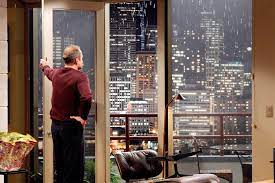

In [2]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

## Info about client
### Timothy Stevens, Seller.

Owns expensive houses in the center, needs to get rid, best timing within a year, open for renovation when profits rise. Your client wants to get a good understanding of the general housing condition in Seattle and surroundings and furthermore to have some recommendations tailored to their needs.

### Step1- Get the Data

In [3]:
import pandas as pd
import psycopg2

import os
from dotenv import load_dotenv

load_dotenv()

DATABASE = os.getenv('DATABASE')
USER_DB = os.getenv('USER_DB')
PASSWORD = os.getenv('PASSWORD')
HOST = os.getenv('HOST')
PORT = os.getenv('PORT')

# Create connection object conn
conn = psycopg2.connect(
    database=DATABASE,
    user=USER_DB,
    password=PASSWORD,
    host=HOST,
    port=PORT
)

cur = conn.cursor()

cur.execute('SELECT * FROM eda.king_county_house_sales LIMIT 10')
cur.fetchall()

conn.close()

# Open connection again because we closed it
conn = psycopg2.connect(
    database=DATABASE,
    user=USER_DB,
    password=PASSWORD,
    host=HOST,
    port=PORT
)

# import the data into a pandas dataframe
## Here the SQL from DBeaver for our EDA project is put
query_string = "set SCHEMA 'eda'; SELECT kchd.*,kchs.date, kchs.price FROM king_county_house_details kchd LEFT JOIN king_county_house_sales kchs ON kchd.id = kchs.house_id"
df_psycopg = pd.read_sql(query_string, conn)

conn.close()

df_psycopg.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3.000,1.000,1180.000,5650.000,1.000,NaN,0.000,3,7,...,0.000,1955,0.000,98178,47.511,-122.257,1340.000,5650.000,2014-10-13,221900.000
1,6414100192,3.000,2.250,2570.000,7242.000,2.000,0.000,0.000,3,7,...,400.000,1951,19910.000,98125,47.721,-122.319,1690.000,7639.000,2014-12-09,538000.000
2,5631500400,2.000,1.000,770.000,10000.000,1.000,0.000,0.000,3,6,...,0.000,1933,NaN,98028,47.738,-122.233,2720.000,8062.000,2015-02-25,180000.000
3,2487200875,4.000,3.000,1960.000,5000.000,1.000,0.000,0.000,5,7,...,910.000,1965,0.000,98136,47.521,-122.393,1360.000,5000.000,2014-12-09,604000.000
4,1954400510,3.000,2.000,1680.000,8080.000,1.000,0.000,0.000,3,8,...,0.000,1987,0.000,98074,47.617,-122.045,1800.000,7503.000,2015-02-18,510000.000


### Step2 - Clean up the data

--- except for bathrooms, floors, lat, and long, floats are converted to int  
--- view, sqft_basement, waterfront, and yr_renoavted columns had null values  
--- date column changed to date-time format  
--- null rows of view and sqft_basement were very low--> dropped    
--- waterfront null rows were tested against the rest --> dropped  
--- yr_renovated still has null values  
--- age_build column is added



In [4]:
df_copy = df_psycopg.copy()

In [5]:
df_copy.dtypes
#inspect the data types on DBeaver

id                 int64
bedrooms         float64
bathrooms        float64
sqft_living      float64
sqft_lot         float64
floors           float64
waterfront       float64
view             float64
condition          int64
grade              int64
sqft_above       float64
sqft_basement    float64
yr_built           int64
yr_renovated     float64
zipcode            int64
lat              float64
long             float64
sqft_living15    float64
sqft_lot15       float64
date              object
price            float64
dtype: object

In [6]:
#is date column date time format
type(df_copy['date'][0])

datetime.date

In [7]:
#what are data in waterfront --yes, no or no information.
df_copy['waterfront'].unique()

array([nan,  0.,  1.])

In [8]:
#what data are in view? 0-4
df_copy['view'].unique()

#make a dict 

array([ 0., nan,  3.,  4.,  2.,  1.])

In [9]:
#fix some float data types to int 
df_copy['bedrooms'] = df_copy['bedrooms'].astype('int')
df_copy['sqft_living'] = df_copy['sqft_living'].astype('int')
df_copy['sqft_lot'] = df_copy['sqft_lot'].astype('int')
df_copy['sqft_above'] = df_copy['sqft_above'].astype('int')
df_copy['sqft_living15'] = df_copy['sqft_living15'].astype('int')
df_copy['sqft_lot15'] = df_copy['sqft_lot15'].astype('int')
df_copy['price'] = df_copy['price'].astype('int')

#those could not be converted since they have NaN values
#df_copy['waterfront'] = df_copy['waterfront'].astype('int')
#df_copy['view'] = df_copy['view'].astype('int')
#df_copy['sqft_basement'] = df_copy['sqft_basement'].astype('int')
#df_copy['yr_renovated'] = df_copy['yr_renovated'].astype('int')

df_copy.head()


,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3,1.000,1180,5650,1.000,NaN,0.000,3,7,...,0.000,1955,0.000,98178,47.511,-122.257,1340,5650,2014-10-13,221900
1,6414100192,3,2.250,2570,7242,2.000,0.000,0.000,3,7,...,400.000,1951,19910.000,98125,47.721,-122.319,1690,7639,2014-12-09,538000
2,5631500400,2,1.000,770,10000,1.000,0.000,0.000,3,6,...,0.000,1933,NaN,98028,47.738,-122.233,2720,8062,2015-02-25,180000
3,2487200875,4,3.000,1960,5000,1.000,0.000,0.000,5,7,...,910.000,1965,0.000,98136,47.521,-122.393,1360,5000,2014-12-09,604000
4,1954400510,3,2.000,1680,8080,1.000,0.000,0.000,3,8,...,0.000,1987,0.000,98074,47.617,-122.045,1800,7503,2015-02-18,510000


In [10]:
import missingno as msno
df_copy.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2391
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     452
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
dtype: int64

In [11]:
#divide the yr_renovated by 10 to fix the data and convert it to int
df_copy['yr_renovated']= df_copy['yr_renovated'].mul(1/10).convert_dtypes()
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  int64  
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  Int64  
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  int64  
 18  sqft_l

In [12]:
#this line converts the rest of the floats to int: view, waterfront, sqft_basement
df_copy2 = df_copy.copy()

df_copy2 = df_copy2.convert_dtypes()

In [13]:
df_copy2.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  Int64  
 1   bedrooms       21597 non-null  Int64  
 2   bathrooms      21597 non-null  Float64
 3   sqft_living    21597 non-null  Int64  
 4   sqft_lot       21597 non-null  Int64  
 5   floors         21597 non-null  Float64
 6   waterfront     19206 non-null  Int64  
 7   view           21534 non-null  Int64  
 8   condition      21597 non-null  Int64  
 9   grade          21597 non-null  Int64  
 10  sqft_above     21597 non-null  Int64  
 11  sqft_basement  21145 non-null  Int64  
 12  yr_built       21597 non-null  Int64  
 13  yr_renovated   17749 non-null  Int64  
 14  zipcode        21597 non-null  Int64  
 15  lat            21597 non-null  Float64
 16  long           21597 non-null  Float64
 17  sqft_living15  21597 non-null  Int64  
 18  sqft_l

In [14]:
#copy2 : all data types are converted and yr_renovated is divide by10. No rows are removed yet. 
df_copy2.head()


#if in the future you run into the error:
## error: Cannot convert non-finite values (NA or inf) to integer:
###Error while type casting for column 'yr_renovated'
#to fix the error, put a condition with query
#df_copy2 = df_psycopg.copy()
#df_copy2.query('yr_renovated.isnull() == False').astype({'yr_renovated': int})

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3,1.000,1180,5650,1.000,<NA>,0,3,7,...,0,1955,0,98178,47.511,-122.257,1340,5650,2014-10-13,221900
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,400,1951,1991,98125,47.721,-122.319,1690,7639,2014-12-09,538000
2,5631500400,2,1.000,770,10000,1.000,0,0,3,6,...,0,1933,<NA>,98028,47.738,-122.233,2720,8062,2015-02-25,180000
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,910,1965,0,98136,47.521,-122.393,1360,5000,2014-12-09,604000
4,1954400510,3,2.000,1680,8080,1.000,0,0,3,8,...,0,1987,0,98074,47.617,-122.045,1800,7503,2015-02-18,510000


In [15]:
#calculate age of the building
current_year = 2023

# Calculate age_build based on conditions
df_copy2['age_build'] = current_year - df_copy2['yr_renovated'].fillna(df_copy2['yr_built']).mask(df_copy2['yr_renovated'] == 0, df_copy2['yr_built'])
df_copy2.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
0,7129300520,3,1.000,1180,5650,1.000,<NA>,0,3,7,...,1955,0,98178,47.511,-122.257,1340,5650,2014-10-13,221900,68
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,1951,1991,98125,47.721,-122.319,1690,7639,2014-12-09,538000,32
2,5631500400,2,1.000,770,10000,1.000,0,0,3,6,...,1933,<NA>,98028,47.738,-122.233,2720,8062,2015-02-25,180000,90
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,1965,0,98136,47.521,-122.393,1360,5000,2014-12-09,604000,58
4,1954400510,3,2.000,1680,8080,1.000,0,0,3,8,...,1987,0,98074,47.617,-122.045,1800,7503,2015-02-18,510000,36


In [16]:
#convert age of the building column to int
df_copy2['age_build'] = df_copy2['age_build'].astype('int')
df_copy2.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
0,7129300520,3,1.000,1180,5650,1.000,<NA>,0,3,7,...,1955,0,98178,47.511,-122.257,1340,5650,2014-10-13,221900,68
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,1951,1991,98125,47.721,-122.319,1690,7639,2014-12-09,538000,32
2,5631500400,2,1.000,770,10000,1.000,0,0,3,6,...,1933,<NA>,98028,47.738,-122.233,2720,8062,2015-02-25,180000,90
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,1965,0,98136,47.521,-122.393,1360,5000,2014-12-09,604000,58
4,1954400510,3,2.000,1680,8080,1.000,0,0,3,8,...,1987,0,98074,47.617,-122.045,1800,7503,2015-02-18,510000,36


<Axes: >

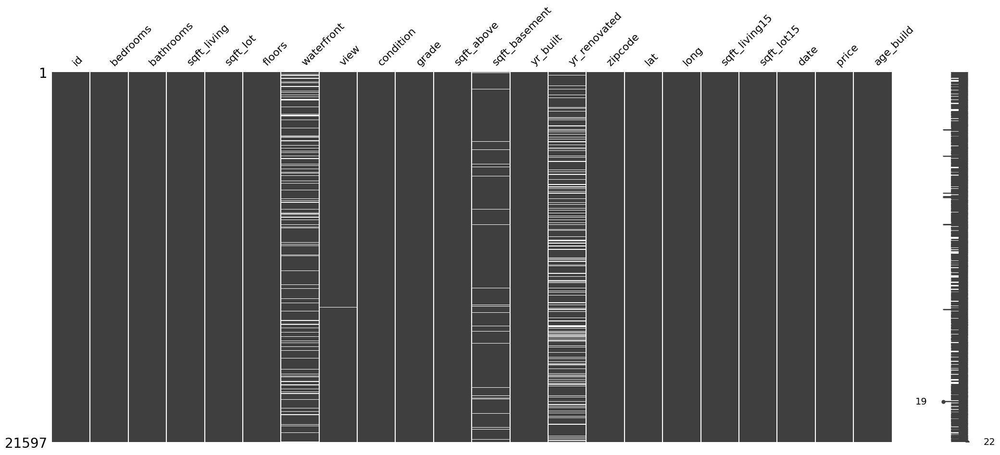

In [17]:
#visualise which values are missing
msno.matrix(df_copy2)

In [18]:
#drop the missing values if percentage of missing values if small
##inspect the percentage of missing values
print(f"numbers of rows : {df_copy2.shape[0]}")
print(f"missing values in waterfront : {round(df_copy2['waterfront'].isna().sum()/df_copy2.shape[0]*100,2)} %")
print(f"missing values in view : {round(df_copy2['view'].isna().sum()/df_copy2.shape[0]*100,2)} %")
print(f"missing values in sqft basement: {round(df_copy2.isna().sum()/df_copy2.shape[0]*100,2)} %")
print(f"missing values in yr_renovated : {round(df_copy2['yr_renovated'].isna().sum()/df_copy2.shape[0]*100,2)} %")



numbers of rows : 21597
missing values in waterfront : 11.07 %
missing values in view : 0.29 %
missing values in sqft basement: id               0.000
bedrooms         0.000
bathrooms        0.000
sqft_living      0.000
sqft_lot         0.000
floors           0.000
waterfront      11.070
view             0.290
condition        0.000
grade            0.000
sqft_above       0.000
sqft_basement    2.090
yr_built         0.000
yr_renovated    17.820
zipcode          0.000
lat              0.000
long             0.000
sqft_living15    0.000
sqft_lot15       0.000
date             0.000
price            0.000
age_build        0.000
dtype: float64 %
missing values in yr_renovated : 17.82 %


In [19]:
#drop the rows where view and sqft basement is null
df_copy3 = df_copy2.copy()
df_copy3 = df_copy3.dropna(subset=['view'])
df_copy3 = df_copy3.dropna(subset=['sqft_basement'])
df_copy3.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2348
view                0
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3749
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
age_build           0
dtype: int64

In [20]:
#decide if you should drop where waterfront is null, does it affect your dataset?
###make a df where the waterfront rows are equal to NaN
df_waterfront_onlynan = df_copy3.query('waterfront.isnull() == True')
df_waterfront_onlynan.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
0,7129300520,3,1.000,1180,5650,1.000,<NA>,0,3,7,...,1955,0,98178,47.511,-122.257,1340,5650,2014-10-13,221900,68
10,1736800520,3,2.500,3560,9796,1.000,<NA>,0,3,8,...,1965,0,98007,47.601,-122.145,2210,8925,2015-04-03,662500,58
23,8091400200,2,1.500,1070,9643,1.000,<NA>,0,3,7,...,1985,<NA>,98030,47.353,-122.166,1220,8386,2014-05-16,252700,38
40,5547700270,4,2.500,2570,5520,2.000,<NA>,0,3,9,...,2000,<NA>,98074,47.614,-122.027,2470,5669,2014-07-15,625000,23
55,9822700295,4,2.500,2830,5000,2.000,<NA>,0,3,9,...,1995,0,98105,47.660,-122.290,1950,5000,2014-05-12,885000,28


Text(0.5, 1.0, 'yy')

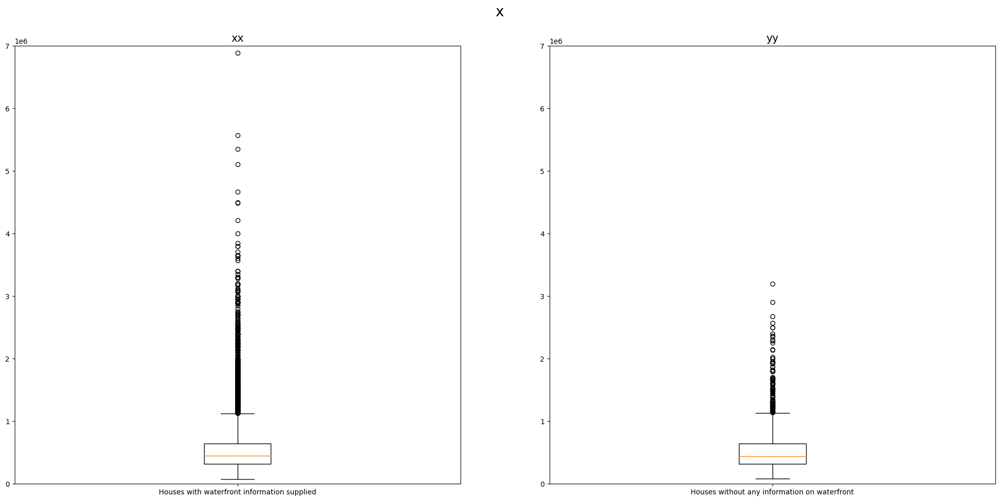

In [21]:
#check if the price range is affacted when you remove waterfront rows that are NaN
### Mean and distr is similar, you can drop
fig, ax = plt.subplots(1, 2, figsize=(20,10)) # create subplots on 2 rows and 3 columns
plt.suptitle('x', fontsize=20)
fig.tight_layout() # tight_layout automatically adjusts subplot params so that the subplot(s) fits in to the figure area
plt.subplots_adjust(hspace = .5, wspace = .2, top = .9) # adjusts the space between the single subplots

ax[0].boxplot(x = df_copy3['price']) # creates boxplot for number of views
ax[0].set_xticklabels(labels=["Houses with waterfront information supplied"]) # sets the label for the ticks on the x-axis
ax[0].set_ylim(0,7000000) # limits the y-axis values from 0 to 2000000 
ax[0].set_title("xx", fontsize = 15); # sets title for subplot

ax[1].boxplot(x = df_waterfront_onlynan['price'])
ax[1].set_xticklabels(labels=["Houses without any information on waterfront"])
ax[1].set_ylim(0,7000000)
ax[1].set_title("yy", fontsize = 15)

In [22]:
#drop rows where waterfront is NaN
df_copy3 = df_copy3.dropna(subset=['waterfront'])
df_copy3.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront          0
view                0
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3323
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
age_build           0
dtype: int64

In [23]:
#check if the age of the building was calculated right. I forgot to check it earlier. 
df_copy3.sort_values(by='yr_renovated', ascending=False).head(10)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
11621,461004730,3,1.000,1150,5000,1.000,0,0,3,8,...,1959,2015,98117,47.681,-122.369,1160,5000,2015-04-06,717000,8
15673,3585900190,3,2.500,3400,38400,1.000,0,4,3,8,...,1955,2015,98177,47.761,-122.372,3400,24338,2014-10-06,825000,8
18560,8935100100,4,3.000,2890,6885,1.000,0,0,3,7,...,1945,2015,98115,47.676,-122.282,2180,6885,2014-07-01,476000,8
16669,5113000420,4,2.750,2400,20000,1.000,0,0,3,8,...,1961,2015,98058,47.456,-122.087,1690,20000,2015-03-20,420000,8
7410,8665900328,4,3.000,1900,9077,2.000,0,0,3,7,...,1954,2015,98155,47.768,-122.304,1900,12868,2015-01-23,459000,8
8683,8835401250,6,2.750,4430,6440,2.000,0,3,3,10,...,1964,2015,98118,47.546,-122.265,3530,7314,2015-05-06,1490000,8
4236,6071800100,6,3.000,2860,17853,1.000,0,0,3,8,...,1962,2015,98006,47.546,-122.175,1920,13452,2015-03-27,815000,8
3153,6821100195,4,3.000,2020,6000,1.000,0,0,3,8,...,1968,2015,98199,47.656,-122.401,1400,6000,2015-03-31,830000,8
11587,7284900030,4,3.250,3090,6744,2.000,0,4,3,9,...,1923,2015,98177,47.768,-122.388,2020,6656,2014-05-22,850000,8
14845,3585900665,5,2.500,4600,19831,1.000,0,3,3,9,...,1956,2015,98177,47.761,-122.378,2890,19831,2014-06-06,805000,8


In [24]:
#forgot that the time is not date-time format from object
df_copy3['date'] = pd.to_datetime(df_copy3['date'], format='%y-%m-%d')
df_copy3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18736 entries, 1 to 21596
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             18736 non-null  Int64         
 1   bedrooms       18736 non-null  Int64         
 2   bathrooms      18736 non-null  Float64       
 3   sqft_living    18736 non-null  Int64         
 4   sqft_lot       18736 non-null  Int64         
 5   floors         18736 non-null  Float64       
 6   waterfront     18736 non-null  Int64         
 7   view           18736 non-null  Int64         
 8   condition      18736 non-null  Int64         
 9   grade          18736 non-null  Int64         
 10  sqft_above     18736 non-null  Int64         
 11  sqft_basement  18736 non-null  Int64         
 12  yr_built       18736 non-null  Int64         
 13  yr_renovated   15413 non-null  Int64         
 14  zipcode        18736 non-null  Int64         
 15  lat            18736 non

In [25]:
#are there duplicated values? --No.
df_copy3.duplicated().value_counts() 

False    18736
Name: count, dtype: int64

In [26]:
#??????decide if you should drop where yr_renovated is null?

### Step 3- Start Making Graphs

In [27]:
import plotly.express as px

In [28]:
plt.style.use('ggplot') 

#### Q1 - Is there a correlation between the zip code and price? If so, then do I need to group all the rest of the data by the zipcode
-Yes some zip codes are more expensive (>3M)  
-Those houses are close to the city center and waterfront

##### ---1- how many distinct zip codes there are?

In [29]:

df_copy3['zipcode'].unique()

<IntegerArray>
[98125, 98028, 98136, 98074, 98053, 98146, 98038, 98115, 98107, 98126, 98019,
 98103, 98003, 98133, 98040, 98092, 98030, 98002, 98119, 98112, 98052, 98027,
 98117, 98058, 98001, 98056, 98166, 98023, 98007, 98070, 98148, 98105, 98042,
 98008, 98059, 98122, 98144, 98004, 98005, 98034, 98075, 98116, 98118, 98199,
 98032, 98045, 98102, 98077, 98198, 98108, 98178, 98177, 98029, 98006, 98109,
 98022, 98033, 98155, 98024, 98168, 98011, 98031, 98010, 98106, 98072, 98188,
 98065, 98055, 98014, 98039]
Length: 70, dtype: Int64

##### ---2- plotting zipcode vs price

In [117]:
import plotly.express as px

# Convert zipcode to string
df_copy4['zipcode'] = df_copy4['zipcode'].astype(str)

# Sort the unique zipcodes in ascending order
sorted_zipcodes = sorted(df_copy4['zipcode'].unique(), key=lambda x: int(x))

# Create a new column to track if the zipcode is within Seattle or not
df_copy4['is_seattle'] = df_copy4['zipcode'].isin(seattle_zip_codes)

# Plot the scatter plot
fig = px.scatter(df_copy4, x='zipcode', y='price', color='is_seattle', title='Zipcode vs Price',
                 category_orders={'zipcode': sorted_zipcodes},
                 color_discrete_map={False: 'gray', True: 'red'})

fig.update_traces(marker=dict(size=8))


fig.update_layout(xaxis_title='Zipcodes of Sold Houses in Seattle', yaxis_title='Price of the House')

fig.update_layout(
    title={
        'text': 'Zipcode vs Price',
        'x': 0.5,  # Set the x-position to 0.5 for center alignment
        'y': 0.82  # Set the y-position to 0.95 for top placement
    },
    xaxis_title='Zipcodes of Sold Houses in Seattle',
    yaxis_title='Price of the House'
)

# Add dashed line for 3 million or higher priced houses
fig.add_shape(
    type='line',
    xref='paper',
    yref='y',
    x0=0,
    y0=3000000,
    x1=1,
    y1=3000000,
    line=dict(
        color='red',
        dash='dash'
    )
)



fig.show()


##### ---3- make a list of zipcodes that have houses sold more than 3M dollar

In [130]:
houses_3m = df_copy4.query('price >= 3000000')

#Check if the query is working
##Sort the unique zipcodes in ascending order
sorted_zipcodes = sorted(houses_3m['zipcode'].unique(), key=lambda x: int(x))
##Make the dot plot
fig = px.scatter(houses_3m, x='zipcode', y='price', title='Zipcode vs Price',
                 category_orders={'zipcode': sorted_zipcodes})
fig.update_traces(marker=dict(size=8))

fig.update_layout(
    title={
        'text': 'Zipcode vs Price',
        'x': 0.5,  # Set the x-position to 0.5 for center alignment
        'y': 0.82  # Set the y-position to 0.95 for top placement
    },
    xaxis_title='Zipcodes of Sold Houses in Seattle',
    yaxis_title='Price of the House'
)

fig.update_layout(xaxis_title='Zipcodes of Sold Houses for >3M Dollars', yaxis_title='Price of the House')

#### Q2-Are houses close to the city center more expensive?

--the dataset I have is spanning outside seattle  
--houses more than >3M are closer to Seattle city center and are waterfront  
--actualy there seems to be a better relationship between waterfront rather than being at the center

##### ---1-Is my data actually spanning a bigger area than seattle?

In [32]:
#1-code showing houses sold on the seattle map vs city center
import plotly.graph_objects as go

In [133]:
#continue
def mark_seattle_city_center(fig):
    seattle_lat = 47.6062  # Latitude of Seattle city center
    seattle_lon = -122.3321  # Longitude of Seattle city center

    fig.add_trace(
        go.Scattermapbox(
            lat=[seattle_lat],
            lon=[seattle_lon],
            mode='markers',
            marker=go.scattermapbox.Marker(
                size=10,
                color='red'
            ),
            name='Seattle City Center'
        )
    )

fig = go.Figure()


# Add your data to the figure using go.Scattermapbox
fig.add_trace(go.Scattermapbox(
    lat=df_copy4["lat"],  # Specify the name of the latitude column in df_copy4
    lon=df_copy4["long"],  # Specify the name of the longitude column in df_copy4
    mode="markers",
    marker=go.scattermapbox.Marker(
        color="steelblue"
    )
))

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        center=dict(
            lat=47.6097,  # Latitude of the approximate center of Seattle area
            lon=-122.3331  # Longitude of the approximate center of Seattle area
        ),
        zoom=10  # Set the initial zoom level of the map
    )
)

mark_seattle_city_center(fig)

fig.show()



In [100]:
#check if the data is spanning a bigger area than seattle
## yes

def mark_seattle_city_boundary(fig):
    # Coordinates outlining the city of Seattle
    seattle_boundary = [
        (-122.4366, 47.7341),
        (-122.4366, 47.4957),
        (-122.2244, 47.4957),
        (-122.2244, 47.7341),
        (-122.4366, 47.7341)
    ]

    fig.add_trace(
        go.Scattermapbox(
            lat=[coord[1] for coord in seattle_boundary],
            lon=[coord[0] for coord in seattle_boundary],
            mode='lines',
            line=dict(
                color='blue',
                width=2
            ),
            name='Seattle City Boundary'
        )
    )

fig = go.Figure()

# Add your data to the figure using go.Scattermapbox
fig.add_trace(go.Scattermapbox(
    lat=df_copy4["lat"],  # Specify the name of the latitude column in df_copy4
    lon=df_copy4["long"],  # Specify the name of the longitude column in df_copy4
    mode="markers",
    marker=go.scattermapbox.Marker(
        color="steelblue"
    )
))

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        center=dict(
            lat=47.6097,  # Latitude of the approximate center of Seattle area
            lon=-122.3331  # Longitude of the approximate center of Seattle area
        ),
        zoom=10  # Set the initial zoom level of the map
    )
)

mark_seattle_city_boundary(fig)

fig.show()


In [135]:
#map showing the price of the houses with darker red

def mark_seattle_city_center(fig):
    seattle_lat = 47.6062  # Latitude of Seattle city center
    seattle_lon = -122.3321  # Longitude of Seattle city center

    fig.add_trace(
        go.Scattermapbox(
            lat=[seattle_lat],
            lon=[seattle_lon],
            mode='markers',
            marker=go.scattermapbox.Marker(
                size=10,
                color='red'
            ),
            name='Seattle City Center'
        )
    )

fig = go.Figure()

# Define the colorscale for the price range
colorscale = [[0, 'rgb(211,211,211)'], [1, 'rgb(255,0,0)']]  # Grayish to reddish colors

# Add your data to the figure using go.Scattermapbox
fig.add_trace(go.Scattermapbox(
    lat=df_copy4["lat"],  # Specify the name of the latitude column in df_copy4
    lon=df_copy4["long"],  # Specify the name of the longitude column in df_copy4
    mode="markers",
    marker=go.scattermapbox.Marker(
        color=df_copy4["price"],  # Arrange the color based on the price values
        colorscale=colorscale,  # Use the customized colorscale
        cmin=df_copy4["price"].min(),  # Set the minimum value for the color range
        cmax=df_copy4["price"].max(),  # Set the maximum value for the color range
        showscale=True,  # Show the color scale legend
        opacity=0.8
    )
))

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        center=dict(
            lat=47.6062,  # Latitude of Seattle city center
            lon=-122.3321  # Longitude of Seattle city center
        ),
        zoom=10  # Set the initial zoom level of the map
    )
)

mark_seattle_city_center(fig)

fig.show()


In [36]:
import pandas as pd
import math

In [134]:
#find the houses 6miles to the city center
## City center latitude and longitude
city_center_lat = 47.6062
city_center_lon = -122.3321

# Function to calculate the distance between two points using Haversine formula
def calculate_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of the Earth in kilometers

    # Convert latitude and longitude to radians
    lat1_rad = math.radians(lat1)
    lon1_rad = math.radians(lon1)
    lat2_rad = math.radians(lat2)
    lon2_rad = math.radians(lon2)

    # Calculate the differences between latitudes and longitudes
    d_lat = lat2_rad - lat1_rad
    d_lon = lon2_rad - lon1_rad

    # Calculate the distance using Haversine formula
    a = math.sin(d_lat / 2) ** 2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(d_lon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    distance = R * c

    return distance


# Find houses within a 6-mile radius
radius = 6  # Miles
houses_within_radius = df_copy4[
    df_copy4.apply(lambda row: calculate_distance(city_center_lat, city_center_lon, row['lat'], row['long']), axis=1) <= radius
]




In [38]:
# How many houses were sold within 6miles to city center
##1648
houses_within_radius['id'].nunique()

1648

##### ---2-houses sold >3M on seeatle map

In [136]:
#map of houses higher price than 3M dollar
## they are all central and waterfront


import plotly.graph_objects as go

# 4- show houses sold >3M on the Seattle map
## they are all central and waterfront

## marking Seattle city center
def mark_seattle_city_center(fig):
    seattle_lat = 47.6062  # Latitude of Seattle city center
    seattle_lon = -122.3321  # Longitude of Seattle city center

    seattle_boundary = [
        (-122.4366, 47.7341),
        (-122.4366, 47.4957),
        (-122.2244, 47.4957),
        (-122.2244, 47.7341),
        (-122.4366, 47.7341)
    ]
    fig.add_trace(
        go.Scattermapbox(
            lat=[seattle_lat],
            lon=[seattle_lon],
            mode='markers',
            marker=go.scattermapbox.Marker(
                size=10,
                color='red'
            ),
            name='Seattle City Center'
        )
    )

    # Coordinates outlining the city of Seattle
 

    fig.add_trace(
        go.Scattermapbox(
            lat=[coord[1] for coord in seattle_boundary],
            lon=[coord[0] for coord in seattle_boundary],
            mode='lines',
            line=dict(
                color='blue',
                width=2
            ),
            name='Seattle City Boundary'
        )
    )
fig = go.Figure()

# Add your data to the figure using go.Scattermapbox
fig.add_trace(go.Scattermapbox(
    lat=houses_3m["lat"],  # Specify the name of the latitude column
    lon=houses_3m["long"],  # Specify the name of the longitude column
    mode="markers",
    marker=go.scattermapbox.Marker(
        color="fuchsia"
    )
))

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        center=dict(
            lat=47.6097,  # Latitude of the approximate center of Seattle area
            lon=-122.3331  # Longitude of the approximate center of Seattle area
        ),
        zoom=10  # Set the initial zoom level of the map
    )
)

mark_seattle_city_center(fig)

fig.show()


##### ---3- What about houses close to city center, can we filter them (within 6 miles)

In [137]:
#makes sure 6miles func works
##houses within 6 miles of the center and their price on the map
import math

def mark_seattle_city_center(fig):
    seattle_lat = 47.6062  # Latitude of Seattle city center
    seattle_lon = -122.3321  # Longitude of Seattle city center

    fig.add_trace(
        go.Scattermapbox(
            lat=[seattle_lat],
            lon=[seattle_lon],
            mode='markers',
            marker=go.scattermapbox.Marker(
                size=10,
                color='red'
            ),
            name='Seattle City Center'
        )
    )

    # Add dashed line for the 6-mile radius
    radius = 6  # Radius in miles
    line_lat, line_lon = [], []
    for angle in range(0, 360):
        lat = seattle_lat + (radius / 69) * math.cos(math.radians(angle))
        lon = seattle_lon + (radius / (69 * math.cos(math.radians(seattle_lat)))) * math.sin(math.radians(angle))
        line_lat.append(lat)
        line_lon.append(lon)

    fig.add_trace(
        go.Scatter(
            x=line_lon,
            y=line_lat,
            mode='lines',
            line=dict(
                color='black',
                width=100,
                dash='dash'
            ),
            hoverinfo='none',
            showlegend=False
        )
    )

fig = go.Figure()

# Add your data to the figure using go.Scattermapbox
fig.add_trace(go.Scattermapbox(
    lat=houses_within_radius["lat"],  # Specify the name of the latitude column
    lon=houses_within_radius["long"],  # Specify the name of the longitude column
    mode="markers",
    marker=go.scattermapbox.Marker(
        color=houses_within_radius["price"],
        colorscale='YlOrRd',  # Use the YlOrRd color scale (yellow to red)
        cmin=min(houses_within_radius["price"]),
        cmax=max(houses_within_radius["price"]),
        size=8,
        colorbar=dict(title='Price'),
        opacity=0.9 # Adjust opacity based on price
    ),
    hovertemplate='<b>Price:</b> $%{marker.color:.2f}<br>Lat: %{lat:.2f}<br>Lon: %{lon:.2f}<extra></extra>'
))



fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        center=dict(
            lat=47.6062,  # Latitude of the approximate center of Seattle area
            lon=-122.3321  # Longitude of the approximate center of Seattle area
        ),
        zoom=10  # Set the initial zoom level of the map
    )
)

mark_seattle_city_center(fig)

fig.show()


In [41]:
# zipcodes within 6 miles of center x price

# Sort the unique zipcodes in ascending order
sorted_zipcodes = sorted(df_copy4['zipcode'].unique(), key=lambda x: int(x))

#make the plot
fig = px.scatter(df_copy4, x='zipcode', y='price', title='Zipcode vs Price')
fig.update_traces(marker=dict(size=8))
fig.update_layout(
    xaxis_title='Zipcodes in Seattle',
    yaxis_title='Price of the House',
    xaxis={'categoryorder': 'array', 'categoryarray': sorted_zipcodes}
)

# Add dashed line for 3 million or higher priced houses
fig.add_shape(
    type='line',
    xref='paper',
    yref='y',
    x0=0,
    y0=3000000,
    x1=1,
    y1=3000000,
    line=dict(
        color='red',
        dash='dash'
    )
)

fig.show()

In [42]:
#zipcodes outside 6 miles x price
houses_outside_radius = df_copy4[df_copy4.apply(lambda row: calculate_distance(city_center_lat, city_center_lon, row['lat'], row['long']), axis=1) > radius]

fig2 = px.scatter(houses_outside_radius, x='zipcode', y='price', title='Zipcode vs Price')
fig2.update_traces(marker=dict(size=8))
fig2.update_layout(xaxis_title='Zipcodes outside the Seattle center',
                   yaxis_title='Price of the House',
                   xaxis={'categoryorder': 'array', 'categoryarray': sorted_zipcodes})
fig2.show()

In [138]:
#color the zipcode graph according to being within 6 miles of center or outside

import plotly.graph_objects as go

# Scatter plot for houses within the radius
scatter_within_radius = go.Scatter(
    x=houses_within_radius['zipcode'],
    y=houses_within_radius['price'],
    mode='markers',
    name='Within Radius',
    marker=dict(color='red')
)

# Scatter plot for houses outside the radius
scatter_outside_radius = go.Scatter(
    x=houses_outside_radius['zipcode'],
    y=houses_outside_radius['price'],
    mode='markers',
    name='Outside Radius',
    marker=dict(color='blue'),
    opacity=0.6
)

# Create the figure and add the scatter plots
fig = go.Figure(data=[scatter_within_radius, scatter_outside_radius])

# Customize the layout
fig.update_layout(
    title={
        'text': 'Houses Within/Outside Radius of 6 miles to Seattle',
        'x': 0.5,  # Set the x-position to 0.5 for center alignment
        'y': 0.82  # Set the y-position to 0.95 for top placement
    },
    xaxis=dict(title='Zip Code'),
    yaxis=dict(title='Price'),
    showlegend=True
)

# Show the plot
fig.show()


#### !!  New df: Filtering data so that we evaluate only houses within Seattle

In [92]:
# Filter the dataset based on Seattle's latitude and longitude boundaries
seattle_data = df_copy4[(df_copy4['lat'] >= seattle_lat_min) & (df_copy4['lat'] <= seattle_lat_max) &
                       (df_copy4['long'] >= seattle_lon_min) & (df_copy4['long'] <= seattle_lon_max)]

# Extract the unique zip codes from the filtered dataset
seattle_zip_codes = seattle_data['zipcode'].unique()

# Print the zip codes belonging to Seattle
print(seattle_zip_codes)


<StringArray>
['98125', '98136', '98146', '98115', '98107', '98126', '98103', '98133',
 '98040', '98119', '98112', '98117', '98105', '98122', '98144', '98116',
 '98118', '98199', '98102', '98108', '98178', '98034', '98109', '98177',
 '98106', '98168', '98155', '98004', '98039', '98028', '98011']
Length: 31, dtype: string


In [44]:
#filter lat and long that are within Seattle city

#seattle boundries
seattle_lat_min = 47.4957  # Minimum latitude of Seattle
seattle_lat_max = 47.7341  # Maximum latitude of Seattle
seattle_lon_min = -122.4366  # Minimum longitude of Seattle
seattle_lon_max = -122.2244  # Maximum longitude of Seattle

# Filter the houses within the Seattle boundaries
houses_in_seattle = df_copy4[
    (df_copy4['lat'] >= seattle_lat_min) &
    (df_copy4['lat'] <= seattle_lat_max) &
    (df_copy4['long'] >= seattle_lon_min) &
    (df_copy4['long'] <= seattle_lon_max)
]

# Print the filtered houses
print(houses_in_seattle)


               id  bedrooms  bathrooms  sqft_living  sqft_lot  floors  \
1      6414100192         3      2.250         2570      7242   2.000   
3      2487200875         4      3.000         1960      5000   1.000   
8      2414600126         3      1.000         1780      7470   1.000   
11     9212900260         2      1.000         1160      6000   1.000   
14     1175000570         5      2.000         1810      4850   1.500   
...           ...       ...        ...          ...       ...     ...   
21591  2997800021         3      2.500         1310      1294   2.000   
21592   263000018         3      2.500         1530      1131   3.000   
21593  6600060120         4      2.500         2310      5813   2.000   
21594  1523300141         2      0.750         1020      1350   2.000   
21596  1523300157         2      0.750         1020      1076   2.000   

       waterfront  view  condition  grade  ...  yr_built  yr_renovated  \
1               0     0          3      7  ...   

In [139]:
##check if filtering worked

def mark_seattle_city_boundary(fig):
    # Coordinates outlining the city of Seattle
    seattle_boundary = [
        (-122.4366, 47.7341),
        (-122.4366, 47.4957),
        (-122.2244, 47.4957),
        (-122.2244, 47.7341),
        (-122.4366, 47.7341)
    ]

    fig.add_trace(
        go.Scattermapbox(
            lat=[coord[1] for coord in seattle_boundary],
            lon=[coord[0] for coord in seattle_boundary],
            mode='lines',
            line=dict(
                color='blue',
                width=2
            ),
            name='Seattle City Boundary'
        )
    )

fig = go.Figure()

# Add your data to the figure using go.Scattermapbox
fig.add_trace(go.Scattermapbox(
    lat=houses_in_seattle["lat"],  # Specify the name of the latitude column in df_copy4
    lon=houses_in_seattle["long"],  # Specify the name of the longitude column in df_copy4
    mode="markers",
    marker=go.scattermapbox.Marker(
        color="steelblue"
    )
))

#put Seattle city center to the center of the image
fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        center=dict(
            lat=47.6097,  # Latitude of the approximate center of Seattle area
            lon=-122.3331  # Longitude of the approximate center of Seattle area
        ),
        zoom=10  # Set the initial zoom level of the map
    )
)

mark_seattle_city_boundary(fig)

fig.show()


#### Q3-How does waterfront correlate with the price
--- prices increases if the house is waterfront regardless of whether using only Seattle data or the whole data   
--- when the houses are within 6 miles, prices have same mean and similar distribution, except there are some houses over 3M dollar, whose prices seem to be affected by parameters other than being in the center or waterfront

##### ---1- how many houses have waterfront and how many not (144 vs 18595)

In [46]:
df_copy4[df_copy4['waterfront'] == 1].count()


id               141
bedrooms         141
bathrooms        141
sqft_living      141
sqft_lot         141
floors           141
waterfront       141
view             141
condition        141
grade            141
sqft_above       141
sqft_basement    141
yr_built         141
yr_renovated     116
zipcode          141
lat              141
long             141
sqft_living15    141
sqft_lot15       141
date             141
price            141
age_build        141
dtype: int64

In [47]:
df_copy4[df_copy4['waterfront'] == 0].count()


id               18595
bedrooms         18595
bathrooms        18595
sqft_living      18595
sqft_lot         18595
floors           18595
waterfront       18595
view             18595
condition        18595
grade            18595
sqft_above       18595
sqft_basement    18595
yr_built         18595
yr_renovated     15297
zipcode          18595
lat              18595
long             18595
sqft_living15    18595
sqft_lot15       18595
date             18595
price            18595
age_build        18595
dtype: int64

##### ---2- plots: houses with or without waterfront x price (all data)

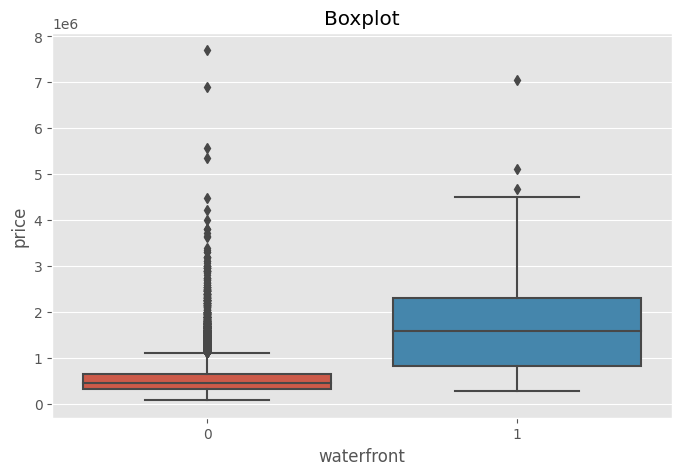

In [48]:
#with or without water front x price, using whole data --- combining matplotlib and sns

from scipy import stats

'''function to make box plot of a column vs another column where the fist column is used to group the values '''
def plot_boxplots_pltsns(data, group_col, value_col):
    # Group the data based on the 'waterfront' column
    grouped_data = data.groupby(group_col)

    # Create a figure with a single subplot
    fig, ax = plt.subplots()

    # Create the boxplots
    sns.boxplot(x=group_col, y=value_col, data=data, ax=ax)

    # Calculate the significance using t-test

    #group0 = grouped_data.get_group(0)[value_col]
    #group1 = grouped_data.get_group(1)[value_col]
    #t_stat, p_value = stats.ttest_ind(group0, group1)

    # Add the significance annotation
    #if p_value < 0.05:
        #significance = '*'
    #else:
        #significance = 'ns'

    # ax.annotate(f'p = {p_value:.3f}{significance}', xy=(0.5, 0), xytext=(0, -40),
    #             xycoords='axes fraction', textcoords='offset points',
    #             ha='center', va='top')

    # Set the plot title and labels
    ax.set_title('Boxplot')
    ax.set_xlabel(group_col)
    ax.set_ylabel(value_col)

    # Show the plot
    plt.show()

plot_boxplots_pltsns(df_copy4, 'waterfront', 'price')




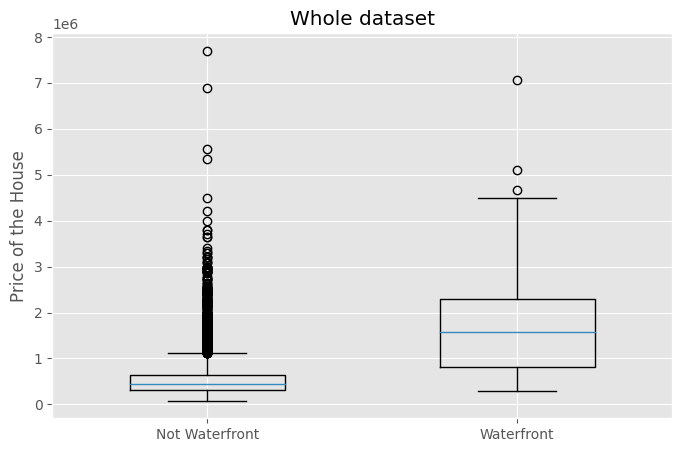

In [142]:
#m#with or without waterfront x price, using whole data --matplotlib alone
from scipy import stats

def plot_boxplots_pltalone(data, value_col, group_col, xlabel, ylabel, titlelabel):
    # Group the data based on the 'waterfront' column
    grouped_data = data.groupby(group_col)

    # Extract the values for each group
    group0 = grouped_data.get_group(0)[value_col]
    group1 = grouped_data.get_group(1)[value_col]

    # Create the boxplot
    plt.boxplot([group0, group1], labels=['Not Waterfront', 'Waterfront'], widths=0.5)

    # Calculate the significance using t-test
    # t_stat, p_value = stats.ttest_ind(group0, group1)

    # Add the significance annotation
    # if p_value < 0.05:
    #     significance = '*'
    # else:
    #     significance = 'ns'

    # plt.annotate(
    #     f'p = {p_value:.3f}{significance}',
    #     xy=(0.5, 0),
    #     xytext=(0, -20),
    #     xycoords='axes fraction',
    #     textcoords='offset points',
    #     ha='center',
    #     va='bottom',
    #     fontsize=12
    # )

    # Set the plot title and labels
    plt.title(titlelabel)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Show the plot
    plt.show()


plot_boxplots_pltalone(df_copy4, 'price', 'waterfront', '', 'Price of the House', 'Whole dataset')

##### ---3-plots: houses with or without waterfront x price (only Seattle data)

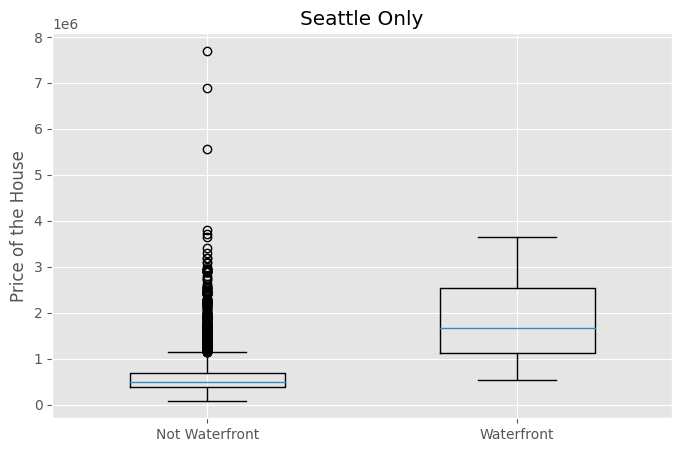

In [143]:
plot_boxplots_pltalone(houses_in_seattle, 'price', 'waterfront', '', 'Price of the House', 'Seattle Only')

##### ---4- houses with or without waterfront x price (houses within 6miles)

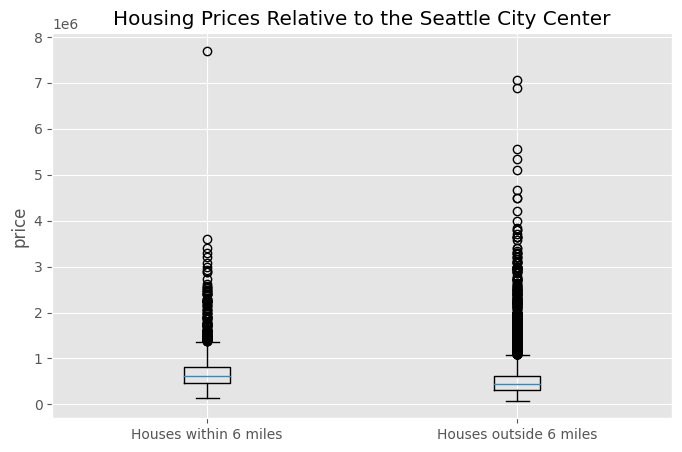

In [51]:
import matplotlib.pyplot as plt
from scipy import stats


def plot_boxplot_2df_pltalone(data1, data2, value_col, my_labels, x_axis_label='', title=''):
    # Concatenate the two dataframes vertically
    data = pd.concat([data1.assign(Group='Group 1'), data2.assign(Group='Group 2')])

    # Create a figure with a single subplot
    fig, ax = plt.subplots()

    # Create the boxplots
    ax.boxplot([data[data['Group'] == 'Group 1'][value_col],
                data[data['Group'] == 'Group 2'][value_col]],
                labels= my_labels )

    # Calculate the significance using t-test
    # group1 = data[data['Group'] == 'Group 1'][value_col]
    # group2 = data[data['Group'] == 'Group 2'][value_col]
    # t_stat, p_value = stats.ttest_ind(group1, group2)

    # Add the significance annotation
    # if p_value < 0.05:
    #     significance = '*'
    # else:
    #     significance = 'ns'

    # ax.annotate(f'p = {p_value:.3f}{significance}', xy=(0.5, 0), xytext=(0, -40),
    #             xycoords='axes fraction', textcoords='offset points',
    #             ha='center', va='top')

    # Set the plot title and labels
    ax.set_title(title)
    ax.set_xlabel(x_axis_label)
    ax.set_ylabel(value_col)

    # Show the plot
    plt.show()


plot_boxplot_2df_pltalone(houses_within_radius, houses_outside_radius, 'price', ['Houses within 6 miles', 'Houses outside 6 miles'], title='Housing Prices Relative to the Seattle City Center')

#### Q4- Does age of building affect the price it is sold for?
--there is a tendency towards newer buildings being sold for higher prices, but it not a sole determinant of the price


In [52]:
#to avoid over-plotting
# if there are too many dots on top of each other, you can make a color legend
## reduce size of the dot

##### ---1- plot : age_build x price (plotly)

In [177]:
fig = px.scatter(df_copy4, x='age_build', y='price')
fig.update_traces(marker=dict(size=8))
fig.update_layout(
    title='Age of the building vs Price (Whole Dataset)',
    xaxis_title='Age of the Building',
    yaxis_title='Price',
    title_x=0.5,
    title_y=0.91
)
fig.show()


In [178]:
#plotly
##yr built vs price (all data)
fig = px.scatter(df_copy4, x='yr_built', y='price', title='Year Built vs Price (Whole Dataset)', hover_data=['yr_built', 'price', 'id'])
fig.update_traces(marker=dict(size=8))
fig.update_layout(xaxis_title='Year Built', yaxis_title='Price', title_x=0.5, title_y=0.82)
fig.show()

In [180]:
fig = px.scatter(houses_in_seattle, x='age_build', y='price')
fig.update_traces(marker=dict(size=8))
fig.update_layout(
    title='Age of the building vs Price (Seattle)',
    xaxis_title='Age of the Building',
    yaxis_title='Price',
    title_x=0.5,
    title_y=0.91
)
fig.show()

In [179]:
#plotly
##yr built vs price (only seattle)
fig = px.scatter(houses_in_seattle, x='yr_built', y='price', title='Year Built vs Price (Seattle)', hover_data=['yr_built', 'price', 'id'])
fig.update_traces(marker=dict(size=8))
fig.update_layout(xaxis_title='Year Built', yaxis_title='Price',  title_x=0.5, title_y=0.82)
fig.show()


In [56]:
#filter the data to get those 2 outliers between 1900 and 1945
df_copy4.query('yr_built >1900 and yr_built < 1945 and price >4000000').head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
3910,9808700762,5,4.500,10040,37325,2.000,1,2,3,11,...,1940,2001,98004,47.650,-122.214,3930,25449,2014-06-11,7060000,22
7245,6762700020,6,8.000,12050,27600,2.500,0,3,4,13,...,1910,1987,98102,47.630,-122.323,3940,8800,2014-10-13,7700000,36


In [57]:
#how do those 2 buildings compared to the buildings that have similar 

##### --- 2- check the age of the buldings among the outliers that are sold for over 3M

In [58]:
#check the age of the buldings 
house_3m = df_copy4[df_copy4.price >= 3000000]

fig = px.scatter(house_3m, x='age_build', y='price', title='Age of the Building vs Price over 3M')
fig.update_traces(marker=dict(size=8))
fig.update_layout(xaxis_title='Age of the Building', yaxis_title='Price over 3M')
fig.show()



#### Q5- Does renovation help to sell the house?
--- it helps slightly(significance has to be calculated)  
--- 2 good examples: some super old houses were sold super high (over 4M dollar), they were renovated (but we do not know if the other qualities of those houses were comparable to the rest of the houses that were built around the same year)  
--- some houses were sold more than once. Actually max twice in the dataset. Those houses were either never renovated or renovated only once. Among the houses that were sold twice, ......  


##### ---1-plot renovated and non-renovated houses vs price

In [59]:
#renovated and non-renovated houses vs price
#df_copy4['yr_renovated'].nunique()

houses_ren = df_copy4.query('yr_renovated > 0')
houses_ren.head()



,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,1951,1991,98125,47.721,-122.319,1690,7639,2014-12-09,538000,32
35,9547205180,3,2.500,2300,3060,1.500,0,0,3,8,...,1930,2002,98115,47.683,-122.310,1590,3264,2014-06-13,696000,21
95,1483300570,4,2.500,3300,10250,1.000,0,0,3,7,...,1946,1991,98040,47.587,-122.249,1950,6045,2014-09-08,905000,32
103,2450000295,3,2.500,2920,8113,2.000,0,0,3,8,...,1950,2010,98004,47.581,-122.196,2370,8113,2014-10-07,1090000,13
125,4389200955,4,2.750,2750,17789,1.500,0,0,3,8,...,1914,1992,98004,47.614,-122.212,3060,11275,2015-03-02,1450000,31


In [60]:
houses_not_ren = df_copy4.query('yr_renovated == 0')
houses_not_ren.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,1965,0,98136,47.521,-122.393,1360,5000,2014-12-09,604000,58
4,1954400510,3,2.000,1680,8080,1.000,0,0,3,8,...,1987,0,98074,47.617,-122.045,1800,7503,2015-02-18,510000,36
5,7237550310,4,4.500,5420,101930,1.000,0,0,3,11,...,2001,0,98053,47.656,-122.005,4760,101930,2014-05-12,1230000,22
8,2414600126,3,1.000,1780,7470,1.000,0,0,3,7,...,1960,0,98146,47.512,-122.337,1780,8113,2015-04-15,229500,63
9,3793500160,3,2.500,1890,6560,2.000,0,0,3,7,...,2003,0,98038,47.368,-122.031,2390,7570,2015-03-12,323000,20


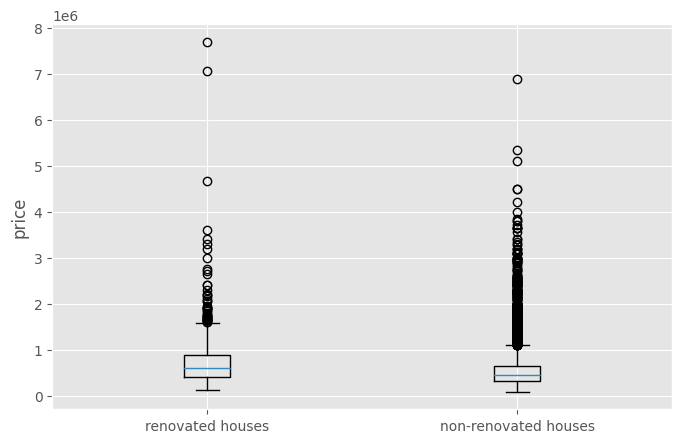

In [61]:
plot_boxplot_2df_pltalone(houses_ren, houses_not_ren, 'price', ['renovated houses', 'non-renovated houses'])

##### ---2- Were the old buildings that were sold very high renovated (outliers)?

In [62]:
#Color the graph from Q4 based on whether or not the building were renovated

#plotly
##yr built vs price (all data)

df_copy5_dropnan_yrren = df_copy4.dropna(subset=['yr_renovated'])

df_copy5_dropnan_yrren.head()



,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,1951,1991,98125,47.721,-122.319,1690,7639,2014-12-09,538000,32
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,1965,0,98136,47.521,-122.393,1360,5000,2014-12-09,604000,58
4,1954400510,3,2.000,1680,8080,1.000,0,0,3,8,...,1987,0,98074,47.617,-122.045,1800,7503,2015-02-18,510000,36
5,7237550310,4,4.500,5420,101930,1.000,0,0,3,11,...,2001,0,98053,47.656,-122.005,4760,101930,2014-05-12,1230000,22
8,2414600126,3,1.000,1780,7470,1.000,0,0,3,7,...,1960,0,98146,47.512,-122.337,1780,8113,2015-04-15,229500,63


In [181]:
##mark the renovated buildings on the yr_built vs price graph

# Create a new column for color based on renovation status
df_copy5_dropnan_yrren['renovation_color'] = np.where(df_copy5_dropnan_yrren['yr_renovated'] > 0, 'Renovated', 'Not Renovated')

# Define the color mapping
color_mapping = {'Renovated': 'red', 'Not Renovated': 'gray'}

# Create the scatter plot
fig = px.scatter(df_copy5_dropnan_yrren, x='yr_built', y='price', title='Year Built vs Price',
                 hover_data=['yr_built', 'price', 'id'],
                 color='renovation_color', color_discrete_map=color_mapping,
                 symbol='renovation_color', symbol_map={'Renovated': 'circle', 'Not Renovated': 'circle-open'})

# Update the marker sizes
fig.update_traces(marker=dict(size=[10 if color == 'red' else 5 for color in df_copy5_dropnan_yrren['renovation_color']]))

# Update the axis titles
fig.update_layout(xaxis_title='Year Built', yaxis_title='Price of the House',  title_x=0.5, title_y=0.82)

# Show the plot
fig.show()


##### ---3- Did one house get sold more than once and does that correlate to the renovation?

In [64]:
# Find the house IDs where the house was sold more than once
df_copy4_dup_ids = df_copy4[df_copy4.duplicated('id', keep=False)]['id']

# Filter the DataFrame to include only the duplicate rows
duplicate_rows = df_copy4[df_copy4['id'].isin(df_copy4_dup_ids)]

# Display the duplicate house IDs and sale prices
duplicate_info = duplicate_rows[['id', 'price', 'yr_built', 'yr_renovated']]
#print(duplicate_info)
duplicate_rows.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
93,6021501535,3,1.500,1580,5000,1.000,0,0,3,8,...,1939,0,98117,47.687,-122.386,1570,4500,2014-07-25,430000,84
94,6021501535,3,1.500,1580,5000,1.000,0,0,3,8,...,1939,0,98117,47.687,-122.386,1570,4500,2014-12-23,700000,84
313,4139480200,4,3.250,4290,12103,1.000,0,3,3,11,...,1997,0,98006,47.550,-122.102,3860,11244,2014-06-18,1380000,26
314,4139480200,4,3.250,4290,12103,1.000,0,3,3,11,...,1997,0,98006,47.550,-122.102,3860,11244,2014-12-09,1400000,26
324,7520000520,2,1.000,1240,12092,1.000,0,0,3,6,...,1922,1984,98146,47.496,-122.352,1820,7460,2014-09-05,232000,39


In [65]:
# Count the number of times each house ID appears in the dataset
sale_counts = df_copy4['id'].value_counts()

# Filter the sale counts to include only the buildings sold more than once
multiple_sales = sale_counts[sale_counts > 1]

# Display the building IDs and their corresponding sale counts
#print(duplicate_sales)
multiple_sales

id
1254200015    2
2206700215    2
1545800290    2
3904100089    2
1450100390    2
             ..
8682262400    2
2473380920    2
5132000140    2
7977201065    2
6021501535    2
Name: count, Length: 145, dtype: Int64

In [66]:
multiple_sales.count()

145

In [67]:
multiple_sales.unique()

<IntegerArray>
[2]
Length: 1, dtype: Int64

##### ---4-make a graph for houses sold more than once and show if they were renovated

In [68]:
#create a new df of only houses sold multiple times

# Count the occurrences of each ID in df_copy4
id_counts = df_copy4['id'].value_counts()

# Filter out the IDs that appear only once
filtered_ids = id_counts[id_counts > 1].index

# Create a new DataFrame with the filtered IDs
df_copy4_mult_sales = df_copy4[df_copy4['id'].isin(filtered_ids)].copy()

df_copy4_mult_sales.head()


,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build
93,6021501535,3,1.500,1580,5000,1.000,0,0,3,8,...,1939,0,98117,47.687,-122.386,1570,4500,2014-07-25,430000,84
94,6021501535,3,1.500,1580,5000,1.000,0,0,3,8,...,1939,0,98117,47.687,-122.386,1570,4500,2014-12-23,700000,84
313,4139480200,4,3.250,4290,12103,1.000,0,3,3,11,...,1997,0,98006,47.550,-122.102,3860,11244,2014-06-18,1380000,26
314,4139480200,4,3.250,4290,12103,1.000,0,3,3,11,...,1997,0,98006,47.550,-122.102,3860,11244,2014-12-09,1400000,26
324,7520000520,2,1.000,1240,12092,1.000,0,0,3,6,...,1922,1984,98146,47.496,-122.352,1820,7460,2014-09-05,232000,39


In [69]:
#house id's were meantioned either once or twice, meaning that one house was sold max twice.
df_copy4['id'].value_counts().unique()

<IntegerArray>
[2, 1]
Length: 2, dtype: Int64

In [70]:
# Show the price in the first and the second sale. 
##?? How to highlight the ones that were renovated in red

# Filter the data frame for house IDs that appeared more than once
multiple_sales = house_id_counts[house_id_counts > 1]

# Filter the data frame for houses with multiple sales
multiple_sales_data = df_copy5_dropnan_yrren[df_copy5_dropnan_yrren['id'].isin(multiple_sales.index)]

# Group the data by house ID
grouped_data = multiple_sales_data.groupby('id')

# Create empty lists for the first and second sale prices
first_sale_prices = []
second_sale_prices = []

# Iterate over the groups
for _, group in grouped_data:
    # Get the prices for the first and second sales
    prices = group['price'].tolist()
    
    # Append the first and second sale prices to the respective lists
    first_sale_prices.append(prices[0])
    second_sale_prices.append(prices[1])

# Create the slope graph
plt.plot([1, 2], [first_sale_prices, second_sale_prices], marker='o', linestyle='-', color='blue')
plt.xticks([1, 2], ['First Sale', 'Second Sale'])
plt.ylabel('Price')
plt.title('Price at First Sale vs Price at Second Sale')

# Show the plot
plt.show()


NameError: name 'house_id_counts' is not defined

In [182]:
#??did this work: # Highlight houses with multiple sales by setting their marker color to red

import plotly.graph_objects as go

fig = go.Figure()

# Scatter plot for all houses
fig.add_trace(go.Scatter(
    x=df_copy4['yr_built'],
    y=df_copy4['price'],
    mode='markers',
    marker=dict(size=8),
    name='Year Built vs Price',
    hovertemplate='Year Built: %{x}<br>Price: %{y}<br>ID: %{text}',
    text=df_copy4['id'].astype(str)  # Convert house IDs to string format for display
))


#fig.update_traces(marker=dict(color=np.where(df_copy4['id'].isin(multiple_sales), 'red', 'steelblue'), opacity= 0.1))


fig.update_traces(marker=dict(size=[10 if color == 'red' else 5 for color in df_copy4['id']]))
# Update layout
fig.update_layout(
    title='Year Built vs Price',
    xaxis_title='Year Built',
    yaxis_title='Price',
)

# Show the plot
fig.show()


##### ---????5-Does the duration between yr_built and yr_ren matter? 

#### Q6- Does the size of the house affect the price

In [72]:
df_copy5_dropnan_yrren.columns

Index(['id', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'date', 'price', 'age_build',
       'renovation_color'],
      dtype='object')

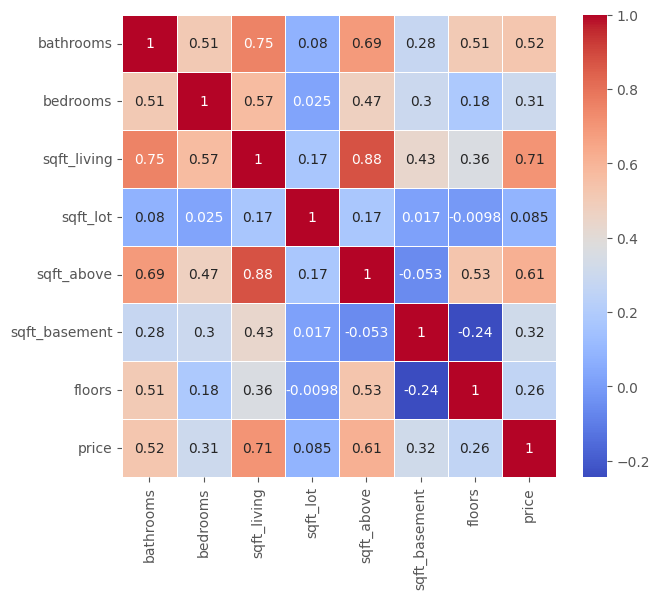

In [74]:
#make a correlation matrix for different size parameters vs price


# drop weather (str), date (datetime), week (int)
##df_copy4_only_size= df_copy5_dropnan_yrren.drop(columns=['waterfront','view','yr_renovated','yr_built', 'condition', 'grade', 'lat', 'long', 'zipcode', 'date', 'sqft_living15', 'sqft_lot15', 'age_build', 'sqft_above', 'sqft_basement', 'bathrooms', 'floors'])
                                           

# correlation matrix between these variables
corr_columns = ["bathrooms", "bedrooms", 'sqft_living', 'sqft_lot', 'sqft_above','sqft_basement', 'floors',"price"]
corr_mtrx = df_copy5_dropnan_yrren[corr_columns].corr()
# set figure size
plt.figure(figsize = (7,6))
# plot heatmap using seaborn
ax = sns.heatmap(corr_mtrx, linewidths = .5, annot = True, cmap= 'coolwarm' )

plt.show()

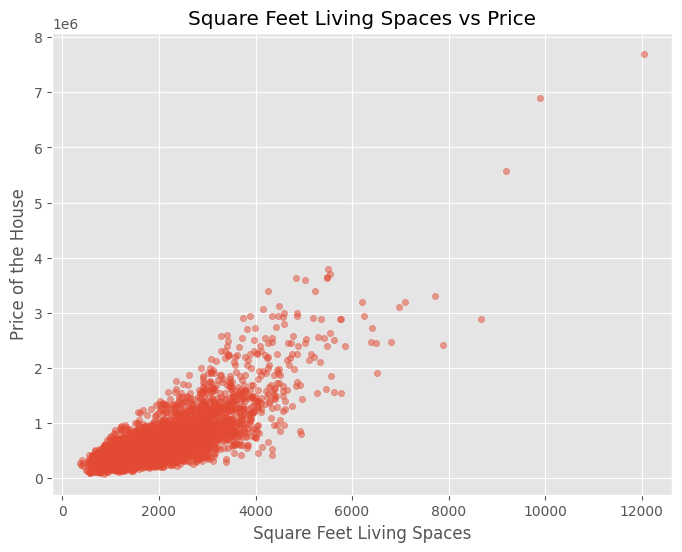

In [204]:
import matplotlib.pyplot as plt

# Get the data for the scatter plot
sqft_living = houses_in_seattle['sqft_living']
price = houses_in_seattle['price']

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Create the scatter plot
ax.scatter(sqft_living, price, s=20, alpha=0.5)

# Set the x-axis label
ax.set_xlabel('Square Feet Living Spaces')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Set the plot title
ax.set_title('Square Feet Living Spaces vs Price')

# Show the plot
plt.show()


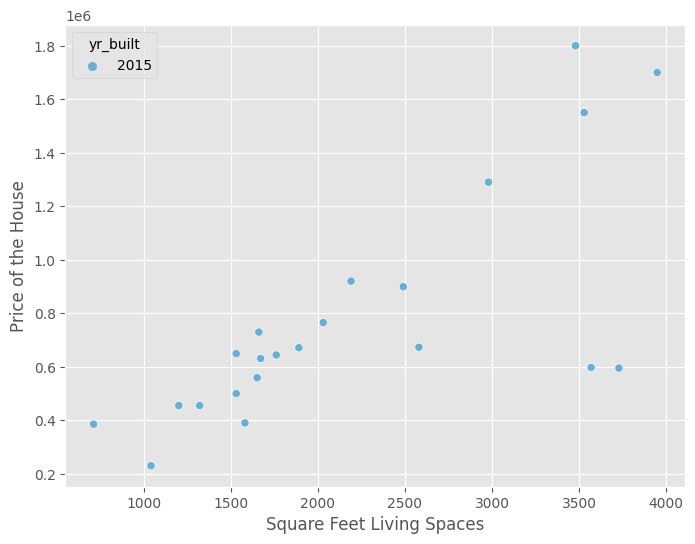

In [214]:
import seaborn as sns
import matplotlib.pyplot as plt

houses_in_seattle_yrstr = houses_in_seattle.copy()

# Convert 'yr_built' column to string
houses_in_seattle_yrstr['yr_built'] = houses_in_seattle['yr_built'].astype(str)

# Filter out rows with missing or NaN values in 'sqft_living' and 'price' columns
df_filtered = houses_in_seattle_yrstr.dropna(subset=['sqft_living', 'price'])

# Filter the DataFrame to include houses built in 2010 or newer
df_filtered = df_filtered[df_filtered['yr_built'].astype(int) == 2015]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Create the scatter plot with hue
sns.scatterplot(data=df_filtered, x='sqft_living', y='price', hue='yr_built', palette='Blues', ax=ax)

# Set the x-axis label
ax.set_xlabel('Square Feet Living Spaces')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Set the plot title
ax.set_title('')

# Show the plot
plt.show()



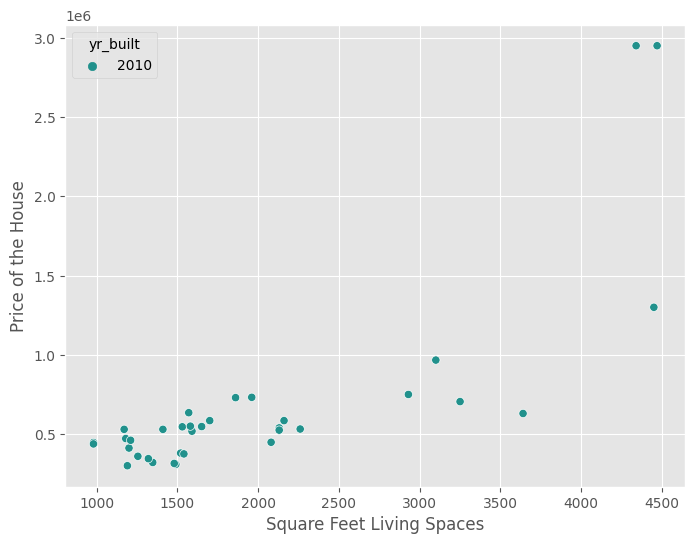

In [212]:

houses_in_seattle_yrstr = houses_in_seattle.copy()

# Convert 'yr_built' column to string
houses_in_seattle_yrstr['yr_built'] = houses_in_seattle['yr_built'].astype(str)

# Filter out rows with missing or NaN values in 'sqft_living' and 'price' columns
df_filtered = houses_in_seattle_yrstr.dropna(subset=['sqft_living', 'price'])

# Filter the DataFrame to include houses built in 2010 or newer
df_filtered = df_filtered[df_filtered['yr_built'].astype(int) == 2010]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Create the scatter plot with hue
sns.scatterplot(data=df_filtered, x='sqft_living', y='price', hue='yr_built', palette='viridis', ax=ax)

# Set the x-axis label
ax.set_xlabel('Square Feet Living Spaces')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Set the plot title
ax.set_title('')

# Show the plot
plt.show()


In [75]:
#calculate a parameter for the size of the house, called SIZE FACTOR.
##plot size factor x price



#### Q7- Does the month or season the house sold affect the price?

In [76]:
#add an additional column of month-year without the day


In [77]:
# Create new column for month


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


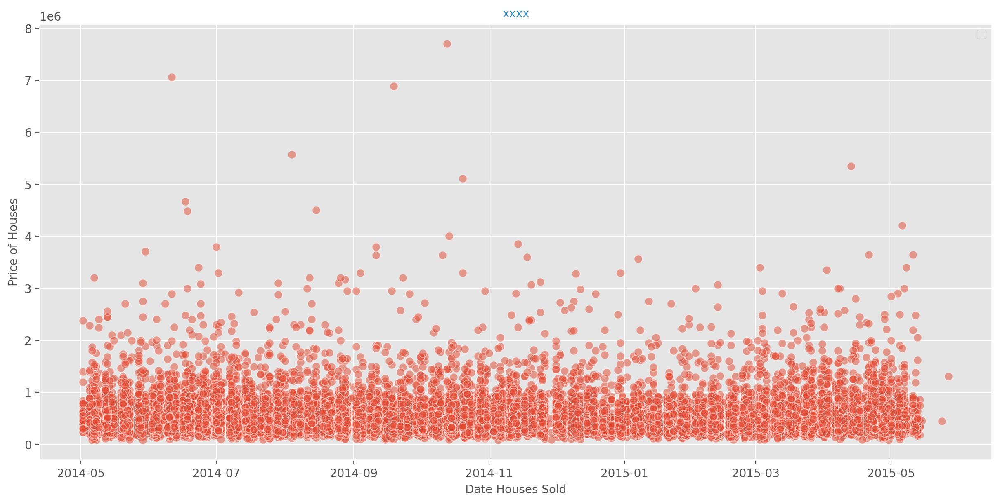

In [78]:

fig, ax = plt.subplots(figsize=(12, 6), constrained_layout=True, dpi=200)

ax = sns.scatterplot(data=df_copy4, x="date", y="price", alpha=0.5, s= 50, ax = ax)

ax.xaxis.label.set_size(10)
ax.yaxis.label.set_size(10)

ax.set(
    xlabel = "Date Houses Sold",
    ylabel = "Price of Houses",
    #xlim = (-10, 22),
    #ylim = (5, 37),

)

#ax.set_aspect('equal')
plt.title("xxxx",
          color = "C1",
          fontdict = {'size':10, }
          )
plt.legend()
plt.show()

In [79]:
#price vs calender month--whole data

##add calender month as a column to df_copy4
# Create a copy of the existing dataframe
df_copy4_timecols = df_copy4.copy()


# Create a new column for month
df_copy4_timecols['month'] = df_copy4_timecols['date'].dt.month

# Create a new column for year-month
df_copy4_timecols['year-month'] = df_copy4_timecols['date'].dt.to_period('M')

df_copy4_timecols.head()


,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build,month,year-month
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,98125,47.721,-122.319,1690,7639,2014-12-09,538000,32,12,2014-12
2,5631500400,2,1.000,770,10000,1.000,0,0,3,6,...,98028,47.738,-122.233,2720,8062,2015-02-25,180000,90,2,2015-02
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,98136,47.521,-122.393,1360,5000,2014-12-09,604000,58,12,2014-12
4,1954400510,3,2.000,1680,8080,1.000,0,0,3,8,...,98074,47.617,-122.045,1800,7503,2015-02-18,510000,36,2,2015-02
5,7237550310,4,4.500,5420,101930,1.000,0,0,3,11,...,98053,47.656,-122.005,4760,101930,2014-05-12,1230000,22,5,2014-05


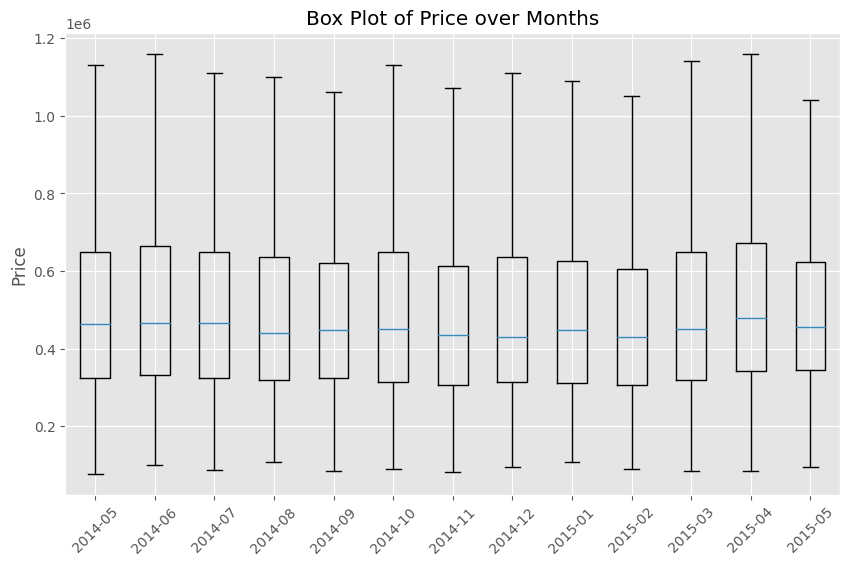

In [80]:
##whole data
# Group the data by the 'year-month' column and collect the prices for each month
monthly_prices = df_copy4_timecols.groupby('year-month')['price'].apply(list)

# Create a list of prices for each month
price_data = [prices for _, prices in monthly_prices.items()]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=monthly_prices.index.strftime('%Y-%m'), showfliers=False)

# Set the y-axis label
ax.set_ylabel('Price')

# Set the plot title
ax.set_title('Box Plot of Price over Months')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Show the plot
plt.show()


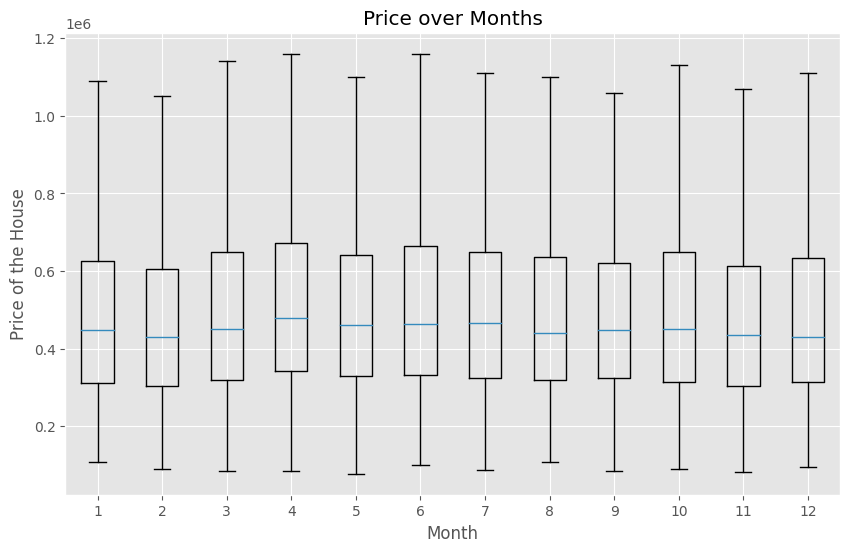

In [184]:
##whole data
# Create a list of price data for each month
price_data = [df_copy4_timecols.loc[df_copy4_timecols['month'] == month, 'price'] for month in range(1, 13)]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=range(1, 13), showfliers=False)

# Set the x-axis label
ax.set_xlabel('Month')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Set the plot title
ax.set_title('Price over Months')

# Show the plot
plt.show()


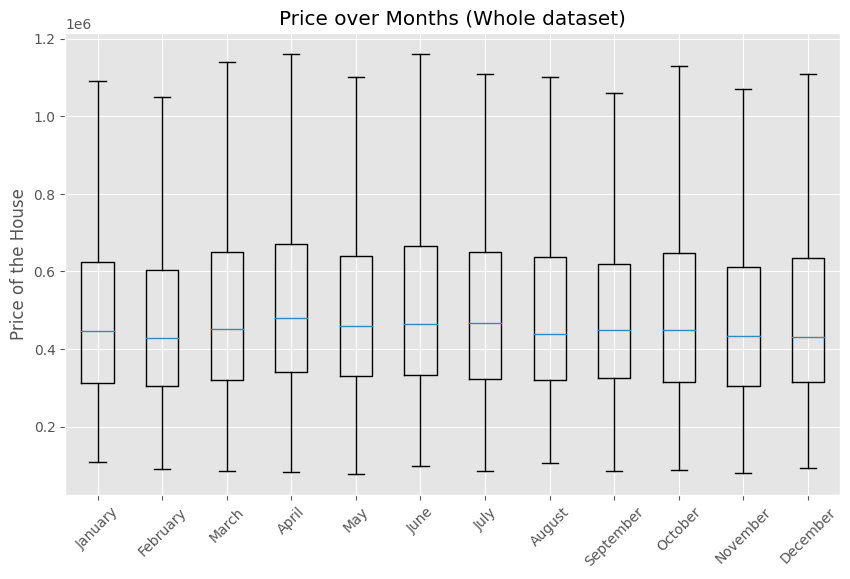

In [189]:


# Create a list of price data for each month
price_data = [df_copy4_timecols.loc[df_copy4_timecols['month'] == month, 'price'] for month in range(1, 13)]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=['January', 'February', 'March', 'April', 'May', 'June',
                               'July', 'August', 'September', 'October', 'November', 'December'],
           showfliers=False)

# Set the x-axis label
ax.set_xlabel('')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Set the plot title
ax.set_title('Price over Months (Whole dataset)')

# Rotate the x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Show the plot
plt.show()


In [82]:
##add calender month as a column to houses in seattle data

# Create a copy of the existing dataframe
houses_in_seattle_timecols = houses_in_seattle.copy()

# Create a new column for month
houses_in_seattle_timecols['month'] = houses_in_seattle_timecols['date'].dt.month

# Create a new column for year-month
houses_in_seattle_timecols['year-month'] = houses_in_seattle_timecols['date'].dt.to_period('M')

houses_in_seattle_timecols.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build,month,year-month
1,6414100192,3,2.250,2570,7242,2.000,0,0,3,7,...,98125,47.721,-122.319,1690,7639,2014-12-09,538000,32,12,2014-12
3,2487200875,4,3.000,1960,5000,1.000,0,0,5,7,...,98136,47.521,-122.393,1360,5000,2014-12-09,604000,58,12,2014-12
8,2414600126,3,1.000,1780,7470,1.000,0,0,3,7,...,98146,47.512,-122.337,1780,8113,2015-04-15,229500,63,4,2015-04
11,9212900260,2,1.000,1160,6000,1.000,0,0,4,7,...,98115,47.690,-122.292,1330,6000,2014-05-27,468000,81,5,2014-05
14,1175000570,5,2.000,1810,4850,1.500,0,0,3,7,...,98107,47.670,-122.394,1360,4850,2015-03-12,530000,123,3,2015-03


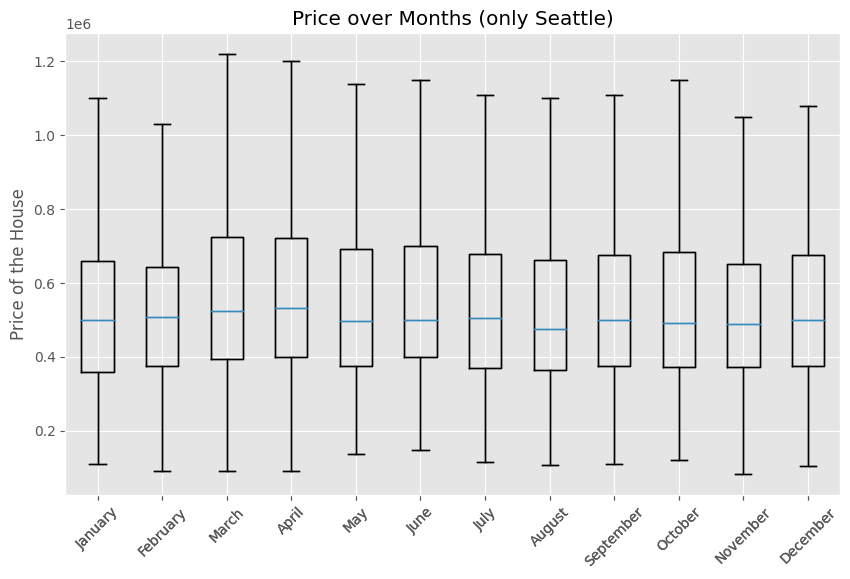

In [201]:
#only seattle
# Create a list of price data for each month
price_data = [houses_in_seattle_timecols.loc[houses_in_seattle_timecols['month'] == month, 'price'] for month in range(1, 13)]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=range(1, 13), showfliers=False)

# Set the x-axis label
ax.set_xlabel('')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Create the box plot
ax.boxplot(price_data, labels=['January', 'February', 'March', 'April', 'May', 'June',
                               'July', 'August', 'September', 'October', 'November', 'December'],
           showfliers=False)
# Set the plot title
ax.set_title('Price over Months (only Seattle)')

# Rotate the x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Show the plot
plt.show()

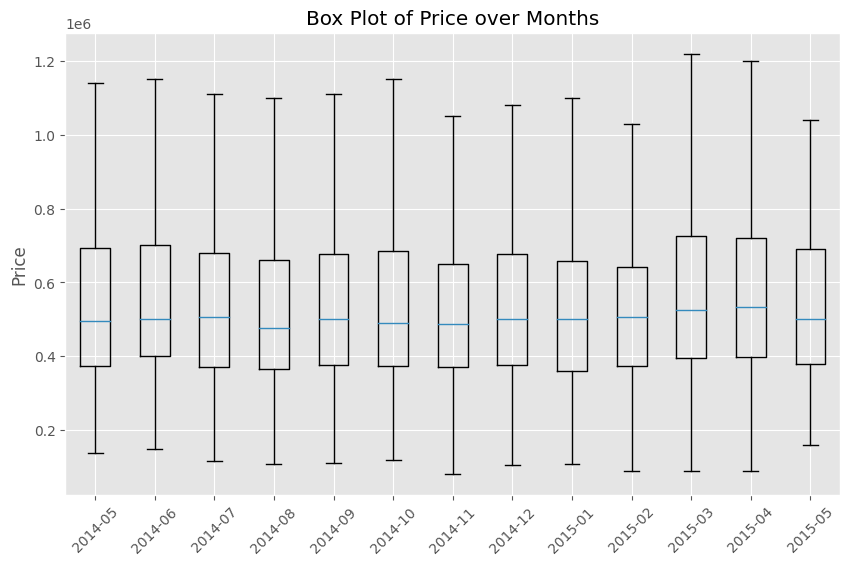

In [84]:
## only seattle

# Group the data by the 'year-month' column and collect the prices for each month
monthly_prices = houses_in_seattle_timecols.groupby('year-month')['price'].apply(list)

# Create a list of prices for each month
price_data = [prices for _, prices in monthly_prices.items()]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=monthly_prices.index.strftime('%Y-%m'), showfliers=False)

# Set the y-axis label
ax.set_ylabel('Price')

# Set the plot title
ax.set_title('Box Plot of Price over Months')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Show the plot
plt.show()

In [85]:
# price vs calender month grouped by zip code


In [86]:
#when were the houses over 3M were sold

# Create a copy of the existing dataframe
houses_3m_timecols = houses_3m.copy()

# Create a new column for month
houses_3m_timecols['month'] = houses_3m_timecols['date'].dt.month

# Create a new column for year-month
houses_3m_timecols['year-month'] = houses_3m_timecols['date'].dt.to_period('M')

houses_3m_timecols.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,age_build,month,year-month
300,3225069065,4,5.000,4550,18641,1.000,1,4,3,10,...,98074,47.605,-122.077,4550,19508,2014-06-24,3080000,21,6,2014-06
656,3760500116,3,2.500,3930,55867,1.000,1,4,4,8,...,98034,47.702,-122.224,2730,26324,2014-11-20,3070000,66,11,2014-11
1162,1247600105,5,5.250,8010,45517,2.000,1,4,3,12,...,98033,47.677,-122.211,3430,26788,2014-10-20,5110000,24,10,2014-10
1446,8907500070,5,5.000,8000,23985,2.000,0,4,3,12,...,98004,47.623,-122.220,4600,21750,2015-04-13,5350000,14,4,2015-04
2083,8106100105,4,4.250,5770,21300,2.000,1,4,4,11,...,98040,47.585,-122.222,4620,22748,2014-11-14,3850000,43,11,2014-11


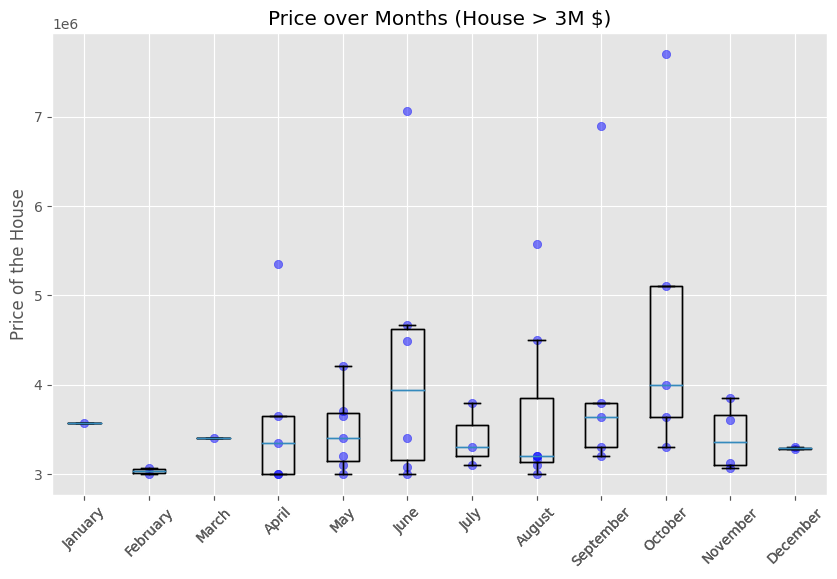

In [200]:
import matplotlib.pyplot as plt

# Create a list of price data for each month
price_data = [houses_3m_timecols.loc[houses_3m_timecols['month'] == month, 'price'] for month in range(1, 13)]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=range(1, 13), showfliers=False)

# Add scatter points for each data point
for month in range(1, 13):
    y = houses_3m_timecols.loc[houses_3m_timecols['month'] == month, 'price']
    x = [month] * len(y)
    ax.scatter(x, y, color='blue', alpha=0.5)

# Set the x-axis label
ax.set_xlabel('')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Set the plot title
ax.set_title('Price over Months (House > 3M $)')

# Create the box plot
ax.boxplot(price_data, labels=['January', 'February', 'March', 'April', 'May', 'June',
                               'July', 'August', 'September', 'October', 'November', 'December'],
           showfliers=False)

# Rotate the x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Show the plot
plt.show()


In [196]:
##add calender month as a column to houses within 6 miles

# Create a copy of the existing dataframe
houses_within_radius_timecols = houses_within_radius.copy()

# Create a new column for month
houses_within_radius_timecols['month'] = houses_within_radius_timecols['date'].dt.month

# Create a new column for year-month
houses_within_radius_timecols['year-month'] = houses_within_radius_timecols['date'].dt.to_period('M')

houses_within_radius_timecols.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,lat,long,sqft_living15,sqft_lot15,date,price,age_build,is_seattle,month,year-month
15,9297300055,4,3.000,2950,5000,2.000,0,3,3,9,...,47.571,-122.375,2140,4000,2015-01-24,650000,44,True,1,2015-01
26,1794500383,3,1.750,2450,2691,2.000,0,0,3,8,...,47.639,-122.360,1760,3573,2014-06-26,937000,108,True,6,2014-06
27,3303700376,3,1.000,1400,1581,1.500,0,0,5,8,...,47.622,-122.314,1860,3861,2014-12-01,667000,114,True,12,2014-12
43,9270200160,3,1.000,1570,2280,2.000,0,0,3,7,...,47.641,-122.364,1580,2640,2014-10-28,685000,101,True,10,2014-10
64,1189001180,3,2.250,1660,6000,1.000,0,0,3,7,...,47.611,-122.297,1440,4080,2014-06-03,425000,44,True,6,2014-06


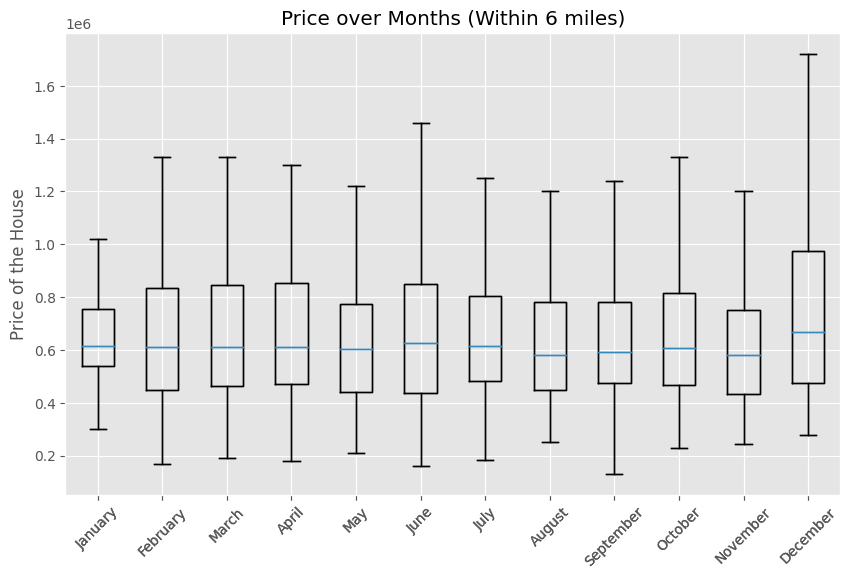

In [199]:
#within 6 miles
# Create a list of price data for each month
price_data = [houses_within_radius_timecols.loc[houses_within_radius_timecols['month'] == month, 'price'] for month in range(1, 13)]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Create the box plot
ax.boxplot(price_data, labels=range(1, 13), showfliers=False)

# Set the x-axis label
ax.set_xlabel('')

# Set the y-axis label
ax.set_ylabel('Price of the House')

# Create the box plot
ax.boxplot(price_data, labels=['January', 'February', 'March', 'April', 'May', 'June',
                               'July', 'August', 'September', 'October', 'November', 'December'],
           showfliers=False)
# Set the plot title
ax.set_title('Price over Months (Within 6 miles)')

# Rotate the x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Show the plot
plt.show()

# Notes

In [87]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

# add significance to the graphs
